# Random forests for image approximation In this question, you will use random forest regression to approximate an image by learning a function, f : R 2 → R , that takes image (x, y) coordinates as input and outputs pixel brightness. This way, the function learns to approximate areas of the image that it has not seen before.

# A) Start with an image of the Mona Lisa. If you don’t like the Mona Lisa, pick another interesting image of your choice.

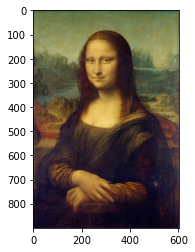

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

plt.imshow(mpimg.imread('Mona_Lisa.jpeg'))



# B) Preprocessing the input. To build your “training set,” uniformly sample 5,000 random (x, y) coordinate locations. Note if you use an image other than the Mona Lisa image linked above you may need to sample a different number of coordinates, so that you sample approximately the same percentage of the total number of pixels in the image (around 1%).

# • What other preprocessing steps are necessary for random forests inputs? Describe them, implement them, and justify your decisions. In particular, do you need to perform mean subtraction, standardization, or unit-normalization?

We do not think any monotonic preprocessing will be necessary for preprocessing. Perhaps this is different because this is R3 (RGB).

In [2]:
# Randomly sample sample_ratio % of xy coordinates
def generate_training_set(image_path, sample_ratio = .01):
    
    # Read image
    image = mpimg.imread(image_path)
   

    # Get image size
    size = np.shape(image)
    sample_size = int(size[0]*size[1]*sample_ratio)
    
    
    # Flatten image to 1d array
    flat_image = image.reshape(-1, image.shape[-1])
    
    # Randomly sample indices to draw
    choosen_indices = np.random.choice(size[0]*size[1],
                                       size= sample_size,
                                       replace= False
                                      )
    
    # Select data from sampled indices
    training_set = flat_image[choosen_indices,:].astype(float)
    
    
    # Convert indices back to X,Y coordinates
    coordinates = np.array(
                    [[int(np.floor(index/size[1])), index % size[1]] 
                     for index in choosen_indices
                    ]
                    )
    
    return training_set, coordinates, size, image/255

    

In [3]:
def log_transform(training_set):
      
    return np.log(training_set + 1)



In [4]:
def log_inverse_transform(training_set):
    
    return np.exp(training_set) - 1


In [5]:
outputs = generate_training_set('Mona_Lisa.jpeg')

[training_set, training_coordinates,
     image_size, original_img] = outputs


# C) Preprocessing the output. Sample pixel values at each of the given coordinate locations. Each pixel contains red, green, and blue intensity values, so decide how you want to handle this. There are several options available to you:

# • Convert the image to grayscale

# • Regress all three values at once, so your function maps (x, y) coordinates to (r, g ,b) values: f : R2 → R3

# • Learn a different function for each channel, f Red : R2 → R, and likewise for f Green, f Blue .

# Note that you may need to rescale the pixel intensities to lie between 0.0 and 1.0. (The default for pixel values may be between 0 and 255, but your image library may have different defaults.) What other preprocessing steps are necessary for random regression forest outputs? Describe them, implement them, and justify your decisions.

We added the function for converting to grayscale and a function for increasing the dimensionality of the input variables. Any monotonic transformation of an existing coordinate feature will not be helpful but we added a few variable including the radius from the center of the image, the x + y and the x - y diagonals. Perhaps this will help us identify regions more accurately.

In [6]:
# Average the RGB data to grayscale
def convertGrayscale(training_set):
    
    grayscale_set = np.mean(training_set,axis = 1)

    return grayscale_set

In [7]:
def dimensionExtension(training_coordinates, image_size):
    # Add cross lines : w= x + y, u = x - y, and depth lines from z^2 = x^2 + y^2
    training_coordinates = np.array(training_coordinates)

    shape = np.shape(training_coordinates)
    
    updated_coordinates = np.zeros((shape[0], 5))
    
    for i in range(shape[0]):
        [x,y] = training_coordinates[i]
        
        x_adj = x/image_size[1] - 1/2
        y_adj = y/image_size[0] - 1/2
        
        z = (x ** 2 + y ** 2) ** 1/2

        all_dims = [x, y, x + y, x - y, z]
        
        updated_coordinates[i,:] = all_dims
        
    return updated_coordinates



# D) To build the final image, for each pixel of the output, feed the pixel coordinate through the random forest and color the resulting pixel with the output prediction. You can then use imshow to view the result. (If you are using grayscale, try imshow(Y, cmap=’gray’) to avoid fake-coloring). You may use any implementation of random forests, but you should understand the implementation and you must cite your sources.

In [8]:
from sklearn.ensemble import RandomForestRegressor
import time as timer


In [9]:
def multiOutputRandomForest(training_data, training_coordinates,
                            image_size, n_estimators = 100, 
                            max_depth = 10, max_samples = .8,
                            use_extension = False):
    
        
    full_coordinates = [[r,c]
                    for r in range(image_size[0])
                    for c in range(image_size[1])
                   ]

    
    
    training_vals = training_coordinates
    full_vals = full_coordinates
    
    if use_extension == True:
        training_vals = dimensionExtension(training_coordinates, image_size)
        full_vals = dimensionExtension(full_coordinates, image_size)

        for c in range(5):
            mean = np.average(full_vals[:,c])
            sigma = np.std(full_vals[:,c])

            training_vals[:,c] = (training_vals[:,c] - mean)/sigma
            full_vals[:,c] = (full_vals[:,c] - mean)/sigma
        


    rfr = RandomForestRegressor(n_estimators=n_estimators,
                                max_depth=max_depth,
                                random_state=0,
                                max_samples = max_samples)
    
    
    rfr.fit(training_vals, training_data)
   

    # Default empty image matrix
    full_matrix = np.zeros(image_size)
    
    # Matrix for displaying what we know from the training set
    known_matrix = np.full(image_size,255)
    

    all_predictions = rfr.predict(full_vals)
    
    used_coor = 0
    
    for idx in range(len(training_coordinates)):
        
        coor = training_coordinates[idx]
        
        full_matrix[coor[0],coor[1],:] = training_data[idx]

        known_matrix[coor[0],coor[1],:] = training_data[idx]
        used_coor = coor
        
            
    for idx in range(len(full_coordinates)):
        coor = full_coordinates[idx]
        
        if np.array_equal(full_matrix[coor[0],coor[1],:], [0,0,0]):
            full_matrix[coor[0],coor[1],:] = all_predictions[idx]


    full_matrix = full_matrix/255
    known_matrix = known_matrix/255

    return full_matrix, known_matrix, rfr


In [10]:
def standardRandomForest(training_data, training_coordinates,
                         image_size):
    
    grayscale_set = convertGrayscale(training_data)
    
    

In [11]:
def display_result(known_image, pred_image, original_img):
    
    f = plt.figure()
    
    f.set_size_inches(18.5, 10.5)
    
    ax1 = f.add_subplot(1,3, 1)
    plt.imshow(known_image)
    ax2 = f.add_subplot(1,3, 2)
    plt.imshow(pred_image)
    ax3 = f.add_subplot(1,3, 3)
    plt.imshow(original_img)
    
    ax1.title.set_text('Known image')
    ax2.title.set_text('Predicted image')
    ax3.title.set_text('True image')

    plt.show(block=True)

In [12]:
def get_difference_norm(predicted_image, original_image):
    

    diff = predicted_image - original_image

    diff_norm = np.linalg.norm(diff.flatten())
    full_norm = np.linalg.norm(original_image.flatten())
    
    
    print("Diff Norm: " + str(diff_norm) + " Original Norm: " + str(full_norm))

    return diff_norm

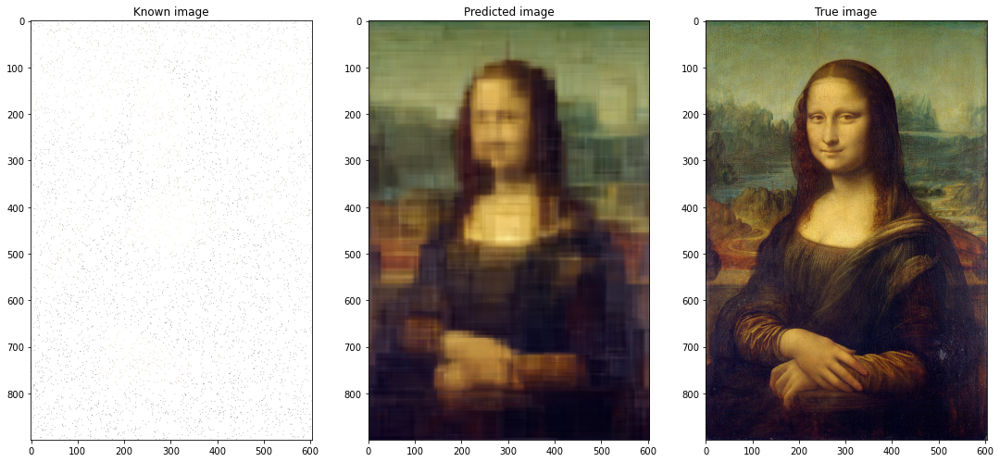

Diff Norm: 80.80808900515115 Original Norm: 430.8615845627264


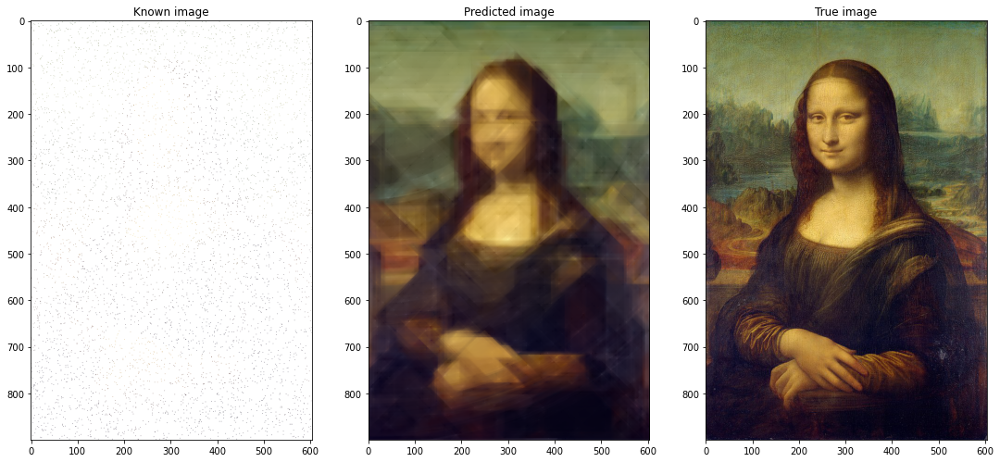

Diff Norm: 77.38842317711854 Original Norm: 430.8615845627264


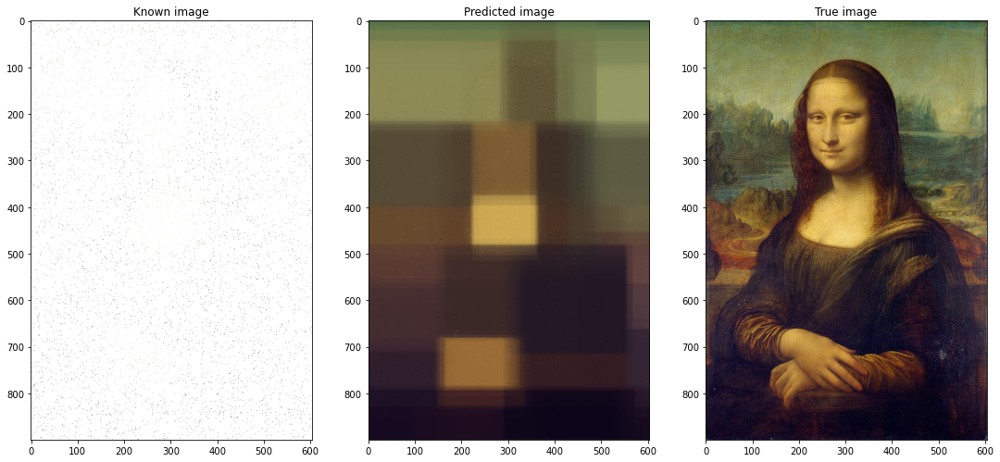

Diff Norm: 128.49065742112955 Original Norm: 430.8615845627264


128.49065742112955

In [13]:


pred_image, known_image, model = multiOutputRandomForest(training_set,
                        training_coordinates,
                        image_size, n_estimators = 200, 
                        max_depth = 15,    
                       )

display_result(known_image, pred_image, original_img)
get_difference_norm(pred_image, original_img)


pred_image, known_image, model = multiOutputRandomForest(training_set,
                        training_coordinates,
                        image_size, n_estimators = 200, 
                        max_depth = 15,
                        use_extension = True,
                       )


display_result(known_image, pred_image, original_img)
get_difference_norm(pred_image, original_img)


pred_image, known_image, model = multiOutputRandomForest(training_set,
                        training_coordinates,
                        image_size, n_estimators = 100, 
                        max_depth = 5
                       )

display_result(known_image, pred_image, original_img)
get_difference_norm(pred_image, original_img)





# E) Experimentation.

# # i. Repeat the experiment for a random forest containing a single decision tree, but with depths 1, 2, 3, 5, 10, and 15. How does depth impact the result? Describe in detail why.

*************** DEPTH : 1 ******************


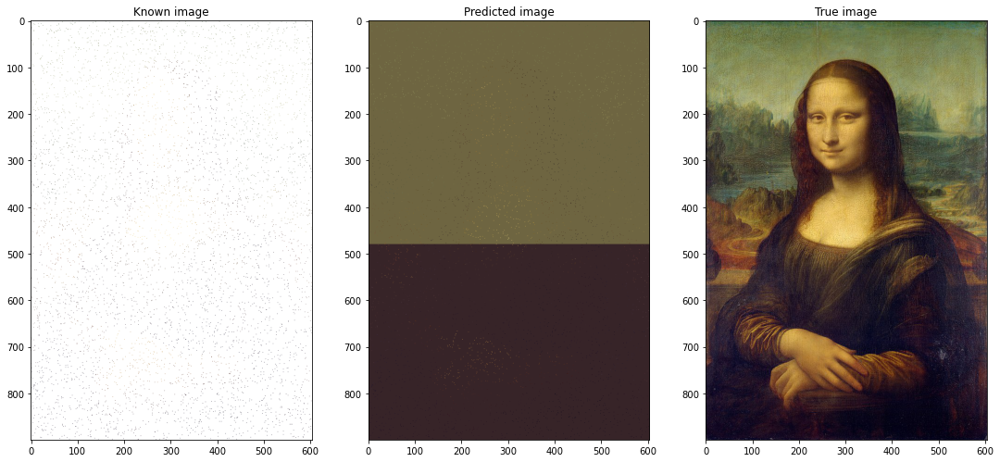

Diff Norm: 194.74989126206037 Original Norm: 430.8615845627264
*************** DEPTH : 2 ******************


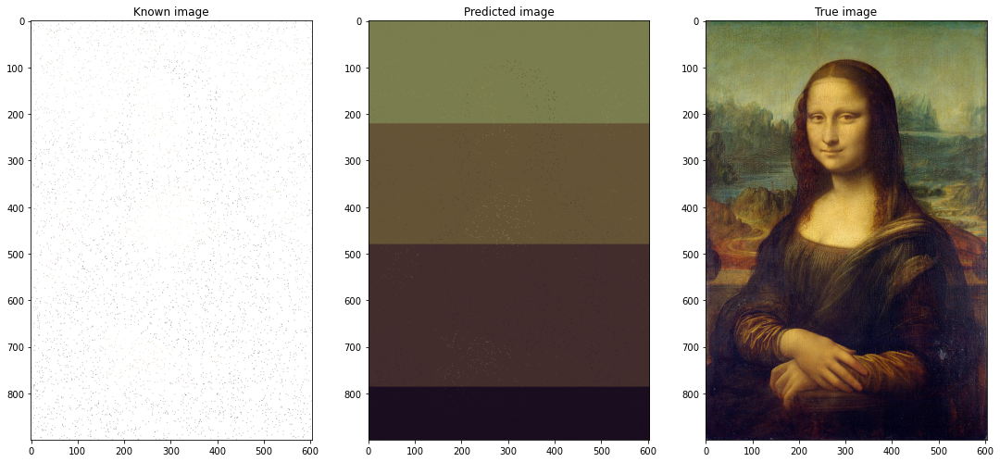

Diff Norm: 181.49873833522537 Original Norm: 430.8615845627264
*************** DEPTH : 3 ******************


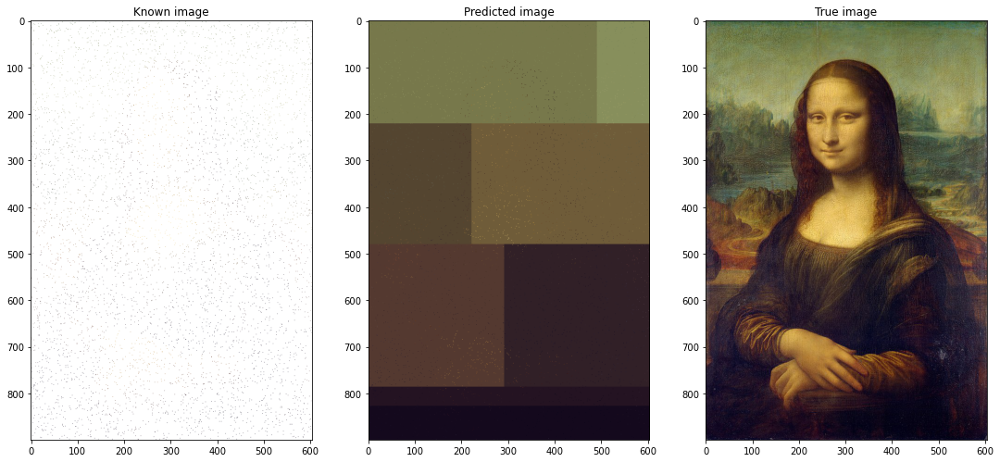

Diff Norm: 175.34410744573256 Original Norm: 430.8615845627264
*************** DEPTH : 5 ******************


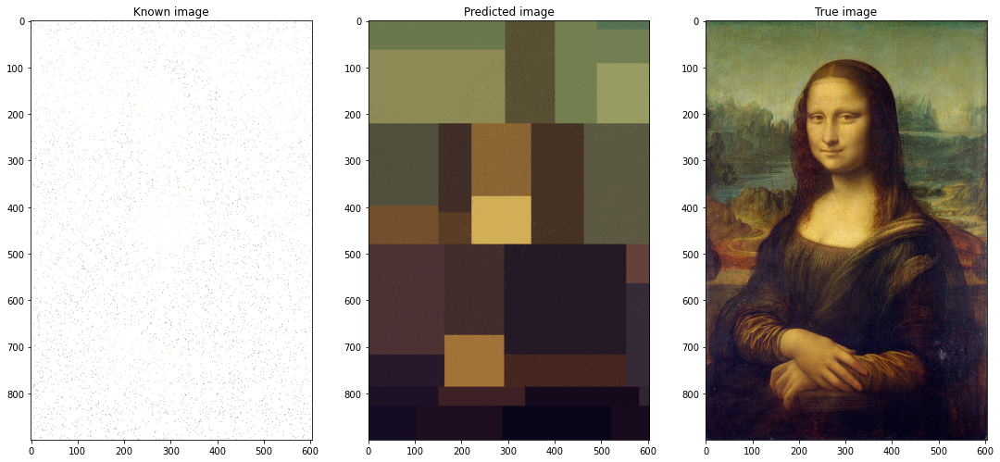

Diff Norm: 139.78008584314335 Original Norm: 430.8615845627264
*************** DEPTH : 10 ******************


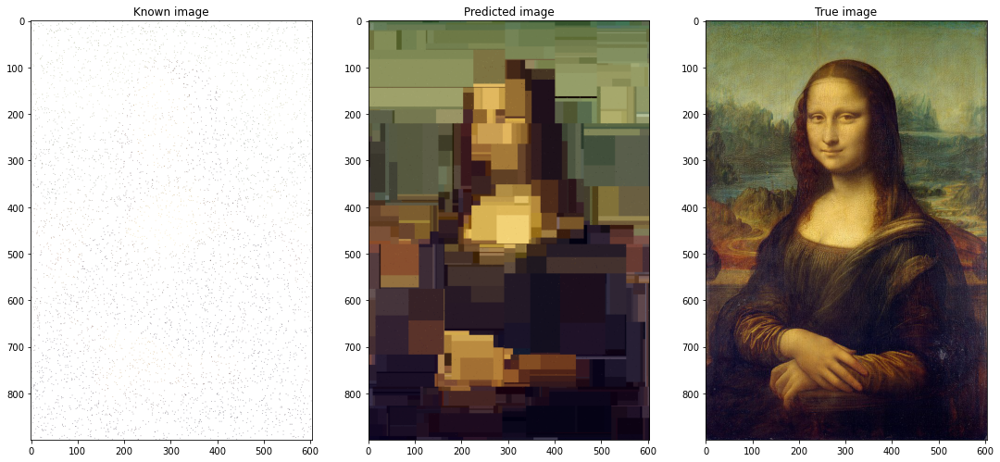

Diff Norm: 109.9492477691297 Original Norm: 430.8615845627264
*************** DEPTH : 15 ******************


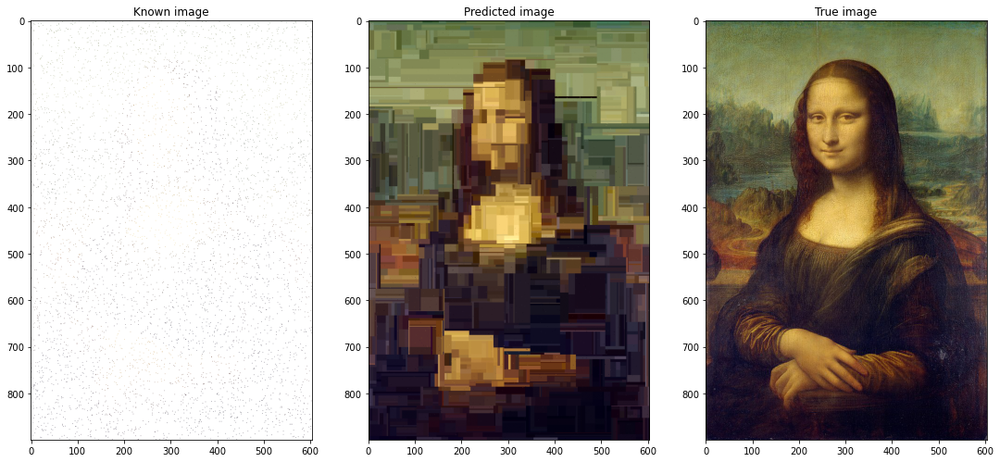

Diff Norm: 115.07719500241535 Original Norm: 430.8615845627264


In [14]:
# Use a single estimator

depths = [1,2,3,5,10,15]
    
for depth in depths:
    print("*************** DEPTH : " + str(depth) + " ******************")
    pred_image, known_image, model = multiOutputRandomForest(training_set,
                            training_coordinates,
                            image_size, n_estimators = 1, 
                            max_depth = depth,
                           )

    display_result(known_image, pred_image, original_img)
    get_difference_norm(pred_image, original_img)



# ii. Repeat the experiment for a random forest of depth 7, but with number of trees equal to 1, 3, 5, 10, and 100. How does the number of trees impact the result? Describe in detail why.

*************** ESTIMATORS : 1 ******************


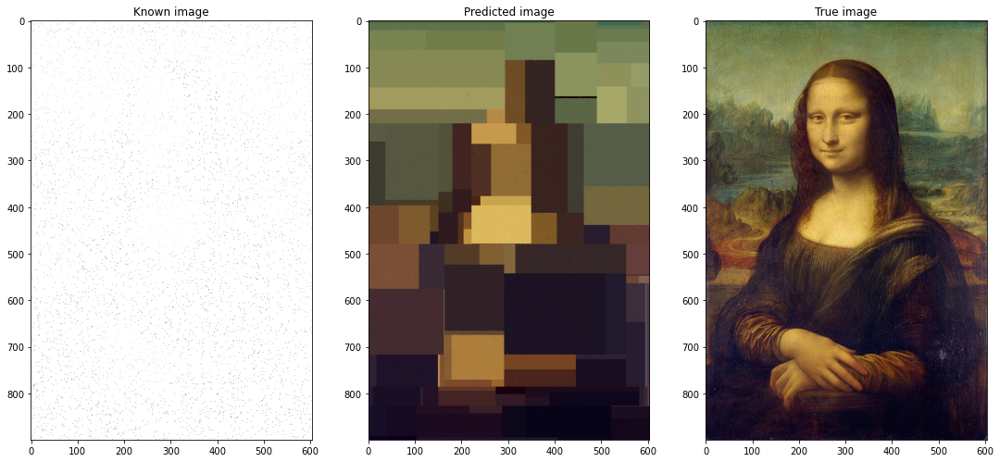

Diff Norm: 121.69048265944717 Original Norm: 430.8615845627264
*************** ESTIMATORS : 2 ******************


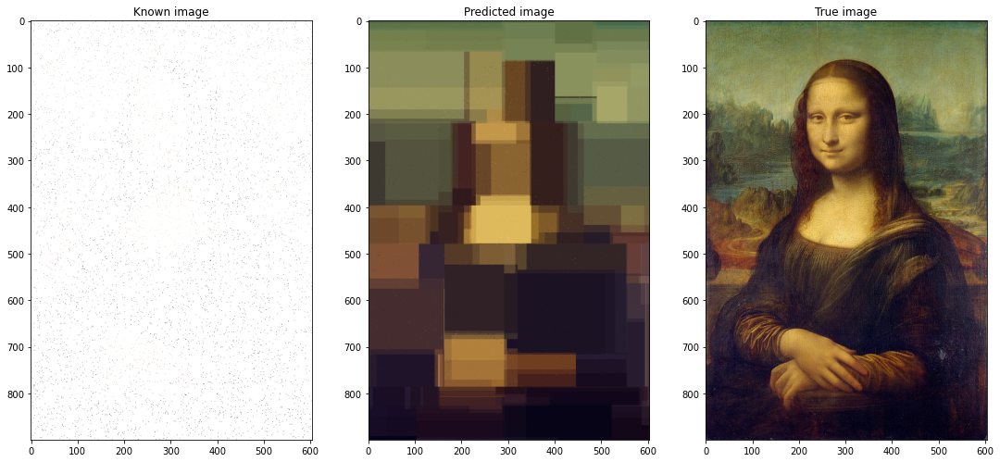

Diff Norm: 114.43015885119024 Original Norm: 430.8615845627264
*************** ESTIMATORS : 3 ******************


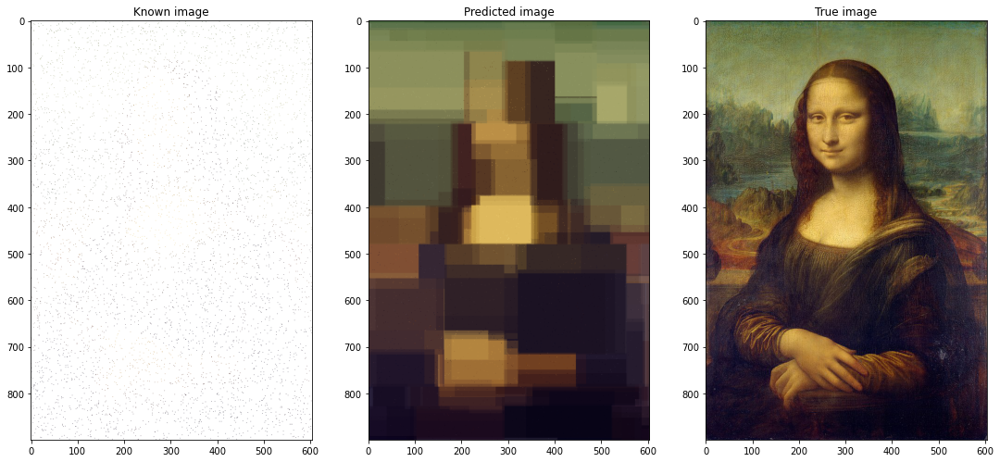

Diff Norm: 109.80692347476267 Original Norm: 430.8615845627264
*************** ESTIMATORS : 5 ******************


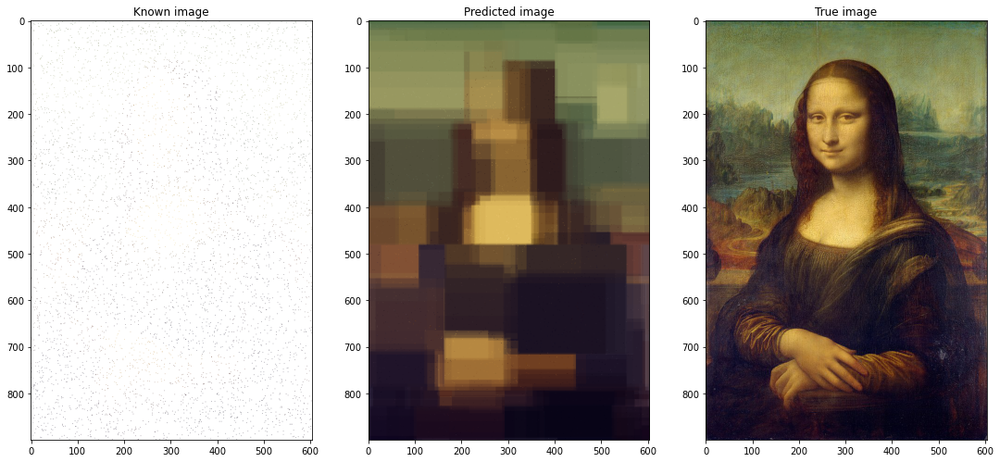

Diff Norm: 107.47259353282931 Original Norm: 430.8615845627264
*************** ESTIMATORS : 10 ******************


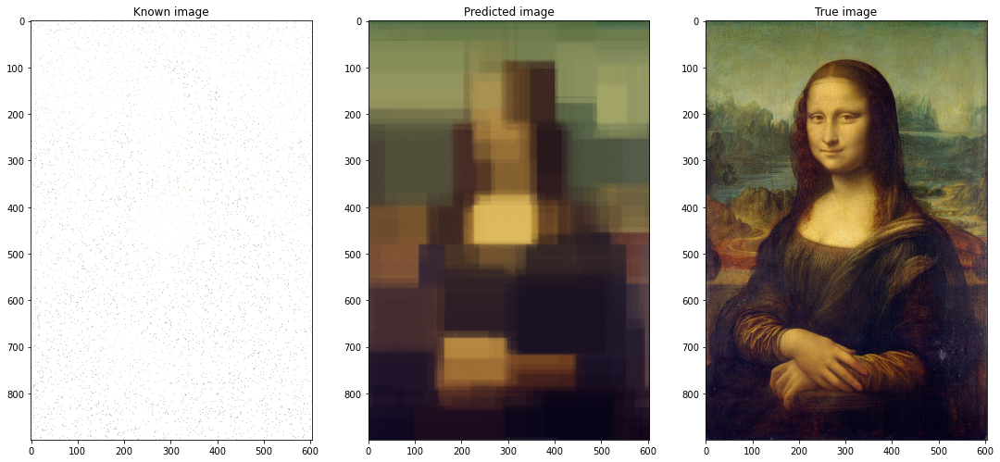

Diff Norm: 106.36754116862741 Original Norm: 430.8615845627264
*************** ESTIMATORS : 15 ******************


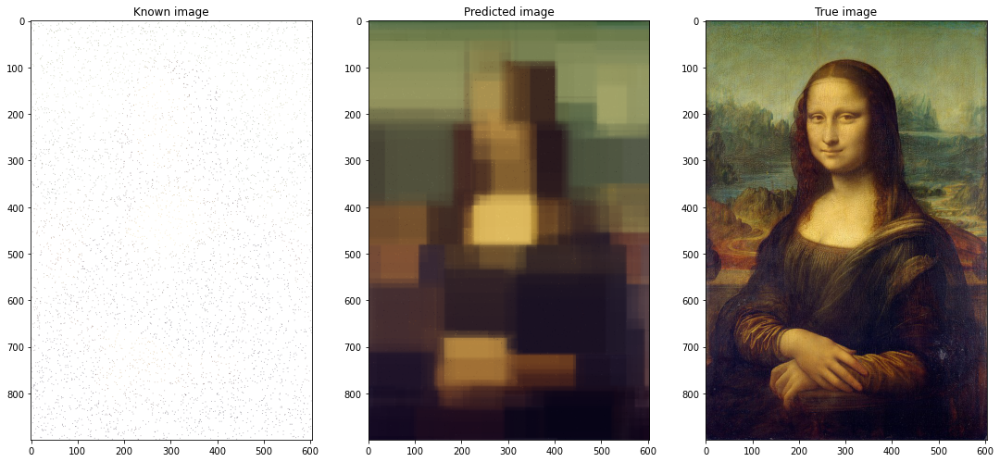

Diff Norm: 105.87941309007999 Original Norm: 430.8615845627264


In [15]:

depth = 7
n_estimators = [1,2,3,5,10,15]

for estimators in n_estimators:
    print("*************** ESTIMATORS : " + str(estimators) + " ******************")
    pred_image, known_image, model = multiOutputRandomForest(training_set,
                            training_coordinates,
                            image_size, n_estimators = estimators, 
                            max_depth = depth,
                           )

    display_result(known_image, pred_image, original_img)
    get_difference_norm(pred_image, original_img)
    
    

# iii. As a simple baseline, repeat the experiment using a k-NN regressor, for k = 1. This means that every pixel in the output will equal the nearest pixel from the “training set.” Compare and contrast the outlook: why does this look the way it does?

In [16]:
from sklearn.neighbors import KNeighborsRegressor
        
    
def KNN(training_data, training_coordinates,
        image_size, k_neighbors, use_extension = False):
    
    full_coordinates = [[r,c]
                    for r in range(image_size[0])
                    for c in range(image_size[1])
                   ]

  
    training_vals = training_coordinates
    full_vals = full_coordinates
    
    if use_extension == True:
        training_vals = dimensionExtension(training_coordinates, image_size)
        full_vals = dimensionExtension(full_coordinates, image_size)

        for c in range(5):
            mean = np.average(full_vals[:,c])
            sigma = np.std(full_vals[:,c])

            training_vals[:,c] = (training_vals[:,c] - mean)/sigma
            full_vals[:,c] = (full_vals[:,c] - mean)/sigma
        


    knr = KNeighborsRegressor(k_neighbors,weights = 'distance')
    
    
    knr.fit(training_vals, training_data)
   

    # Default empty image matrix
    full_matrix = np.zeros(image_size)
    
    # Matrix for displaying what we know from the training set
    known_matrix = np.full(image_size,255)
    

    all_predictions = knr.predict(full_vals)

    
    for idx in range(len(training_coordinates)):
        
        coor = training_coordinates[idx]
        
        full_matrix[coor[0],coor[1],:] = training_data[idx]

        known_matrix[coor[0],coor[1],:] = training_data[idx]

            
    for idx in range(len(full_coordinates)):
        coor = full_coordinates[idx]
        
        if np.array_equal(full_matrix[coor[0],coor[1],:], [0,0,0]):
            full_matrix[coor[0],coor[1],:] = all_predictions[idx]


    full_matrix = full_matrix/255
    known_matrix = known_matrix/255

    return full_matrix, known_matrix, knr

*************** Neighbors : 1 ******************


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


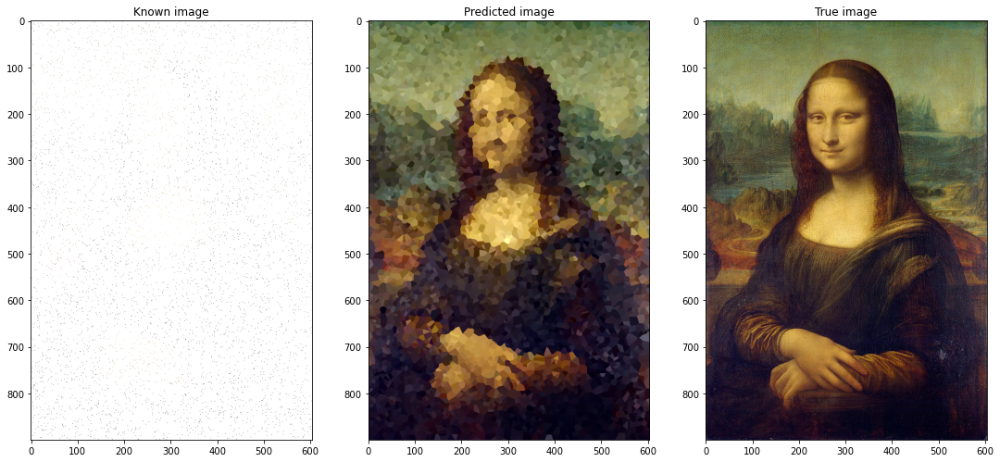

Diff Norm: 99.61710586853225 Original Norm: 430.8615845627264
*************** Neighbors : 5 ******************


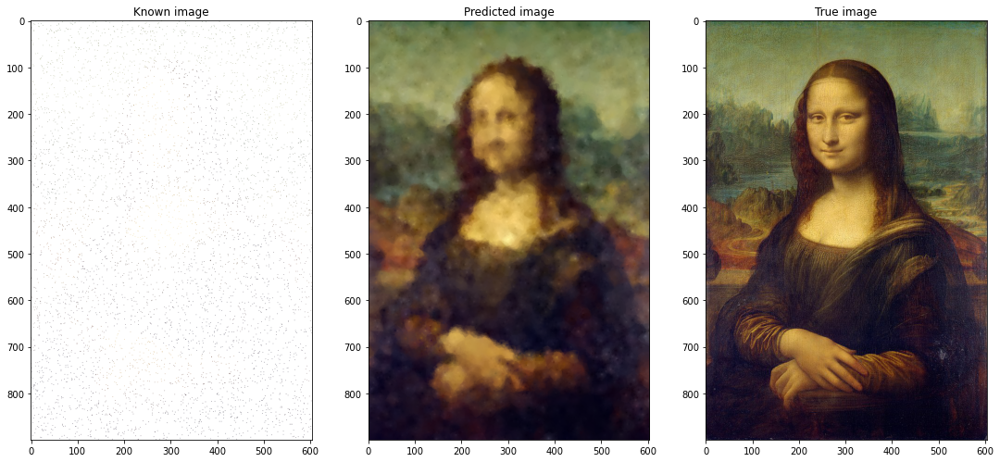

Diff Norm: 79.57453815179461 Original Norm: 430.8615845627264
*************** Neighbors : 10 ******************


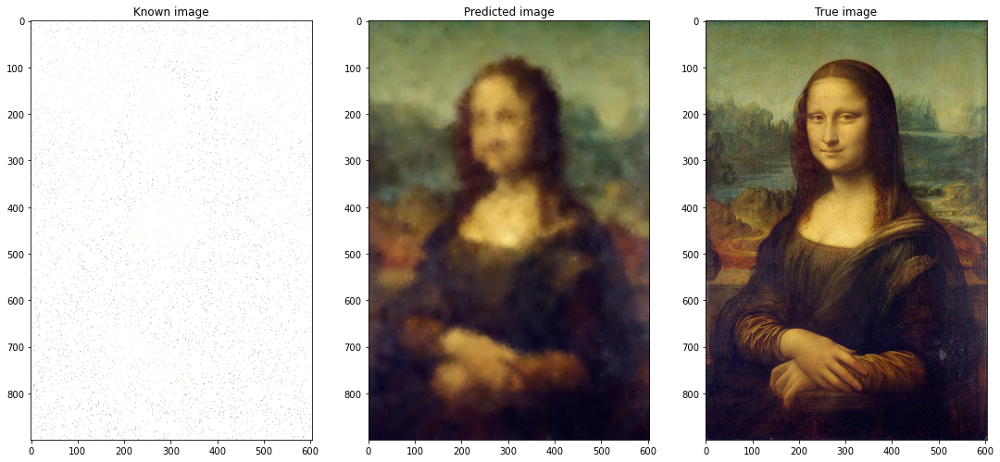

Diff Norm: 79.00146440432306 Original Norm: 430.8615845627264
*************** Neighbors : 15 ******************


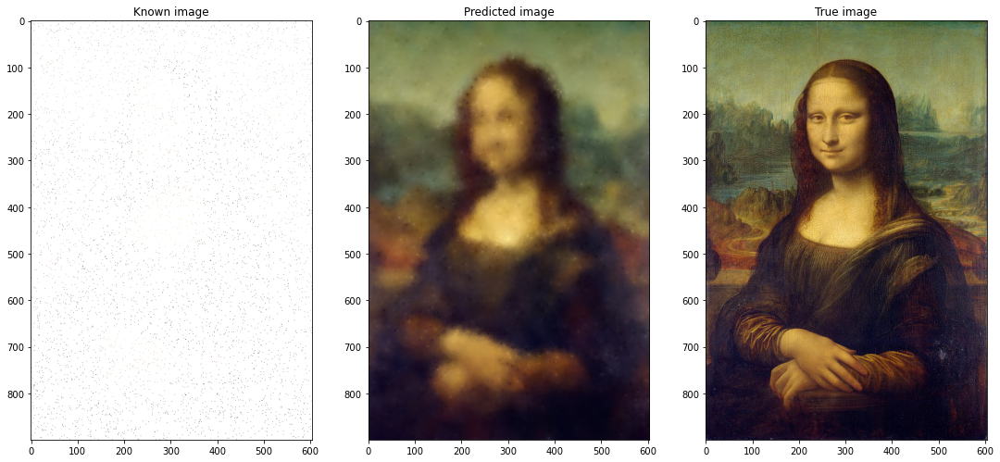

Diff Norm: 80.32115422341984 Original Norm: 430.8615845627264


In [17]:

k_neighbors = [1,5,10,15]


best_knn = []
best_acc = -1

for k in k_neighbors:
    print("*************** Neighbors : " + str(k) + " ******************")
    
    pred_image, known_image, model = KNN(training_set,
                                  training_coordinates,
                                  image_size,
                                  k_neighbors = k,
                                  use_extension = False
                                 )
    
    display_result(known_image, pred_image, original_img)
    norm = get_difference_norm(pred_image, original_img)
    
    if norm < best_acc or best_acc == -1:
        best_acc = norm
        best_knn = pred_image
    

# iv. (Optional) Experiment with different pruning strategies of your choice.

**************** DEEP TREE WITH MANY ESTIMATORS ******************* 


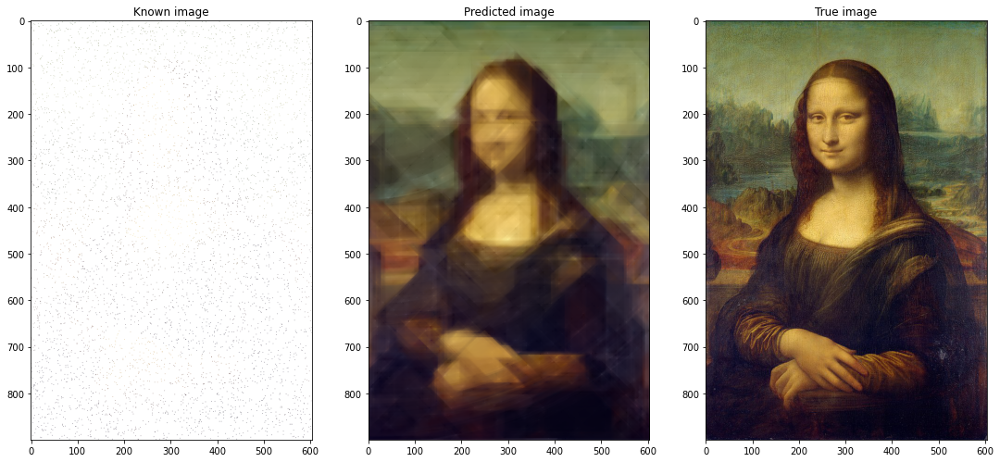

Diff Norm: 77.38842317711854 Original Norm: 430.8615845627264
******** DEEP TREE WITH MANY ESTIMATORS AVERAGED WITH KNN ********* 


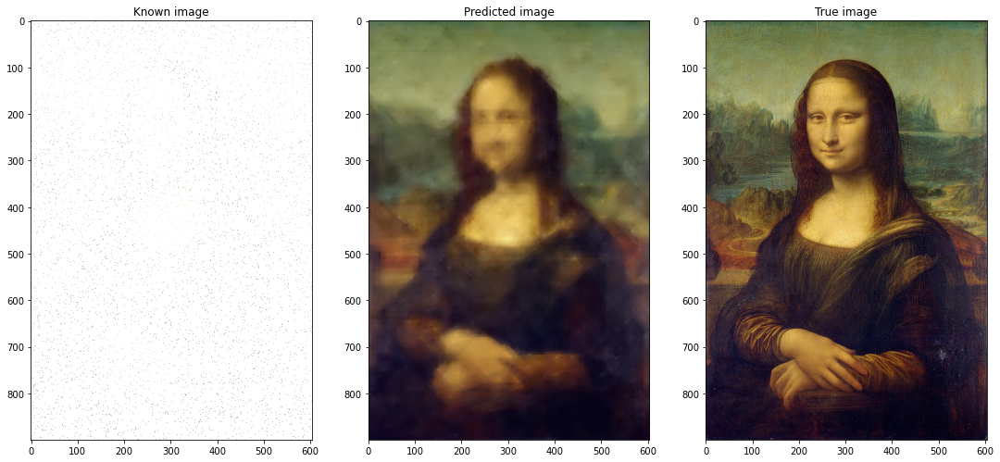

Diff Norm: 76.89742956304985 Original Norm: 430.8615845627264


In [18]:

pred_image, known_image, model = multiOutputRandomForest(training_set,
                        training_coordinates,
                        image_size, n_estimators = 200, 
                        max_depth = 15,
                        use_extension = True,
                       )

print("**************** DEEP TREE WITH MANY ESTIMATORS ******************* ")

display_result(known_image, pred_image, original_img)
diff = get_difference_norm(pred_image, original_img)


print("******** DEEP TREE WITH MANY ESTIMATORS AVERAGED WITH KNN ********* ")

combined_img = (pred_image + best_knn)/2


display_result(known_image, combined_img, original_img)
diff = get_difference_norm(combined_img, original_img)


# F) Analysis.

# i. What is the decision rule at each split point? Write down the 1-line formula for the split point at the root node for one of the trained decision trees inside the forest. Feel free to define any variables you need.

At each split point, we have a sample set X_s. The decision tree picks a single feature i and a cutoff threshold c for which the impurity decrease at that node is maximized. 

The impurity of a node for regression is defined as the variance at that node.

Let sigma_s = impurity at node_s

Let X_s_l, X_s_r be the resulting left and right sets of the X_s after the decision rule

Let N_s be the number of samples in set X_s, N is total number of all samples


Then we can define the impurity decrease for a cut c of feature i as

        ImpurityDecrease_i,c = N_s / N * (sigma_s^2 - N_s_r / N_s * sigma_s_r^2
                    - N_s_l / N_s * sigma_s_l^2)
                    
Then the optimal split at this node will be

        ARG MAX_i,c (ImpurityDecrease_i,c)
              
                    
                    

In [19]:

from sklearn.tree import export_text
import re

def plotDecisions(model, print_depth = 1):
    
    first_tree = model.estimators_[0]
    
    
    feature_names = ['X','Y','X+Y','X-Y','SQRT(X^2 + Y^2)']

    
    r = export_text(first_tree,
                    feature_names=feature_names,
                    max_depth = print_depth - 1)
    
    
    print(r)
    

The root condition of the first tree in the forest will be

In [20]:
plotDecisions(model,print_depth = 1)

|--- X <= 0.12
|   |--- truncated branch of depth 15
|--- X >  0.12
|   |--- truncated branch of depth 15



# ii. Why does the resulting image look like the way it does? What shape are the patches of color, and how are they arranged?

If we had just used X,Y coordinates, which are perpendicular, we would have seen patches that are rectangular. However, since we implemented X+Y (bottom left to top right cut), X - Y (top left to bottom right cut), and Z = SQRT(X^2 + Y ^ 2) (circular cuts) we see patches that are a combination of n-gon polygons with n defined by the depth of the tree and circular strokes.

# iii. Straightforward: How many patches of color may be in the resulting image if the forest contains a single decision tree? Define any variables you need and provide an upper bound.

Let I be the sample size of the data

Let D be the maximum depth of the data

Let K be the same size of the data (K=2 for X,Y features)

Let L be the minimum leaf size

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

Assumption: Min Impurity Decrease = 0

Assumption: Input data is just X,Y coordinates that is K = 2

Assumption: Input data is unique. That is, there does not exist and i,j such that (X_i,Y_i) = (X_j,Y_j)


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

In order to get the maximum number of patches we want to maximum the number of leaf nodes. Therefore, in the upper bound case, we will continue to branch until we have hit the maximum depth or minimum leaf size.

This means we want to maximize the number of splits. If we were able to use every split, we would get 2^D leaf nodes. 

In order to do this, we want to ensure that we always have a large enough sample size to split. However, we are bound by the fact that we may not have enough samples to create each leaf. The maximum number of leafs that can be created is I/L.

Let T be the maximum number of patches of a single tree, then

        T = MAX(1, MIN(⌊I/L⌋, 2^D))
        

# iv. Tricky: How many patches of color might be in the resulting image if the forest contains n decision trees? Define any variables you need and provide an upper bound.

Let I be the sample size of the data

Let K be the same size of the data (K=2 for X,Y features)

Let D be the maximum depth of the data

Let L be the minimum leaf size

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

Assumption: Min Impurity Decrease = 0

Assumption: Input data is just X,Y coordinates that is K = 2

Assumption: Input data is unique. That is, there does not exist and i,j such that (X_i,Y_i) = (X_j,Y_j)


Assumption: Bootstrapping is used (if not then every tree will equal and there will be MAX(1, MIN(⌊I/L⌋,2^D)) colors)

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

From the previous question we have that each tree can have up to MAX(1, MIN(⌊I/L⌋,2^D)) patches

In the upper bounding case, each cut of each tree would be distinct from each cut of every other tree. 

Furthermore, we want to maximize the number of intersections between cuts and for each cut to cut the most space.

Therefore, for each tree n, we want every cut to be a cut on the same feature. In this 2d case every tree is just a cut of vertical or horizontal lines. 

If we split each tree in this way then the number of color patches will be equal to:
    
        patches = (1 + total vertical cuts)*(1 + total horizontal cuts)

where:
       
       total cuts = n * cuts per tree = total vertical cuts + total horizontal cuts,

                  = n * MAX(1, MIN(⌊I/L⌋,2^D))
                 
          
by the AM-GM inequality, we know that this is maximized if total vertical cuts = total horizontal cuts. Therefore we want the them to be as close as possible. If N is even then the number of cuts on each side is equal otherwise the other side has an extra set of cuts.

Let us define T as the upper bound of the total number of patches of a single tree and P as the upper bound of the total nubmer of patches of the forest. Then we get,
        
        T = MAX(1, MIN(⌊I/L⌋,2^D))
        
        P = (⌊N/2⌋*(T - 1) + 1)*(⌈N/2⌉*(T - 1) + 1)

